# Decision tree

A decision tree is a decision support tool that uses a tree-like model of decisions and their possible consequences, including chance event outcomes, resource costs, and utility. It is one way to display an algorithm that only contains conditional control statements.

Decision trees are commonly used in operations research, specifically in decision analysis, to help identify a strategy most likely to reach a goal, but are also a popular tool in machine learning.

# Decision tree on Amzon fine food Review 

Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews

The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review

# Objective :-

Here we have to apply Decision-Tree classfication Alogoritm in various method for AMZON fine food review and check which 
method is very good.

1). Train,CV and test the data.

2). Here we are going to perform GridsearchCV for cossvalidation for finding best maxdepth.

3). we will check the accuarcy and F1score for all the vectorization

In [1]:
import os
os.getcwd()

'C:\\Users\\Nicky\\Desktop\\my work\\Decission_Tree'

In [2]:
#Importing the nessary library for this assignement .
import numpy as np
import pandas as pd
import sqlite3 as sql
from time import time
import pickle
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
#Peforemance measurment techniques
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
import pickle
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from tqdm import tqdm #for Instantly make your loops show a smart progre

In [3]:
#Functions to save objects for later use and retireve it
def export(obj,filename):
    pickle.dump(obj,open(filename+".dmp","wb"))
def import1(filename):
    temp = pickle.load(open(filename+".dmp","rb"))
    return temp

# Loading the cleaned data

In [4]:
#Using sqlite3 to retrieve data from sqlite file

con = sql.connect("final.sqlite")#Loading Cleaned/ Preprocesed text that we did in Text Preprocessing

#Using pandas functions to query from sql table
food1 = pd.read_sql_query("""
SELECT * FROM Reviews 
""",con)

#Reviews is the name of the table given
#Taking only the data where score != 3 as score 3 will be neutral and it won't help us much
food1.head(2)

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,CleanedText
0,150528,150529,0006641040,A25ACLV5KPB4W,"Matt Hetling ""Matt""",0,1,positive,1108425600,"Nice cadence, catchy rhymes",In June<br />I saw a charming group<br />of ro...,b'june saw charm group rose begin droop pep ch...
1,150506,150507,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,positive,1191456000,chicken soup with rice months,This is a fun way for children to learn their ...,b'fun way children learn month year learn poem...


In [5]:
food1.groupby('Score').count()

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Time,Summary,Text,CleanedText
Score,,,,,,,,,,,
negative,57107,57107,57107,57107,57107,57107,57107,57107,57107,57107,57107
positive,336824,336824,336824,336824,336824,336824,336824,336824,336824,336824,336824


In [6]:
def label(x):
    if x == "positive":
        return 1
    else:
        return 0
food1["Score"] = food1["Score"].map(label) #Map all the scores as the function polarity i.e. positive or negative

In [7]:
food1_sample=food1.sample(n=200000) #Taking random sample from hole dataset
food1_sample.sort_values('Time',inplace=True)
food1_sample.groupby('Score').count()

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Time,Summary,Text,CleanedText
Score,,,,,,,,,,,
0,29016,29016,29016,29016,29016,29016,29016,29016,29016,29016,29016
1,170984,170984,170984,170984,170984,170984,170984,170984,170984,170984,170984


In [8]:
from sklearn.model_selection import TimeSeriesSplit
timesplit = TimeSeriesSplit(n_splits=3)

# Bag of Words (BoW)

The bag-of-words model is a simplifying representation used in natural language processing and information retrieval. In this model, a text is represented as the bag of its words, disregarding grammar and even word order but keeping multiplicity.

In [29]:
#Breaking into Train and test
X_train, X_test, y_train, y_test = train_test_split(food1_sample['CleanedText'].values,food1_sample['Score'].values,test_size=0.3,shuffle=False)

#Text -> Uni gram Vectors
bi_gram = CountVectorizer(ngram_range=(1,2),max_features=5000) 
X_train = bi_gram.fit_transform(X_train)
#normalize the data
X_train = preprocessing.normalize(X_train) #normalization of data has better accurac than mean centering and scalling
print("Train Data Size: ",X_train.shape)
X_test = bi_gram.transform(X_test)
#normalize the data
X_test = preprocessing.normalize(X_test)
print("Test Data Size: ",X_test.shape)

Train Data Size:  (140000, 5000)
Test Data Size:  (60000, 5000)


In [74]:
from sklearn.tree import DecisionTreeClassifier
alogo = DecisionTreeClassifier(class_weight='balanced',min_samples_split=5,min_samples_leaf=2)
#alogo = DecisionTreeClassifier(min_samples_split=,min_samples_leaf=25)
#params we need to try on classifier
param_grid = {'max_depth':[int(i) for i in range(5, 40, 2)]} 
gsv = GridSearchCV(alogo,param_grid,cv=timesplit,verbose=1,n_jobs=-1,scoring='f1_micro')
gsv.fit(X_train,y_train)
export(gsv,"gsv_bigram")
print("Best HyperParameter: ",gsv.best_params_)
print("Best Score: %.2f%%"%(gsv.best_score_*100))

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed:  7.0min finished


Best HyperParameter:  {'max_depth': 39}
Best Accuracy: 77.38%


In [75]:
gsv

GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=3),
       error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1_micro', verbose=1)

In [76]:
Cross_validation_score=gsv.cv_results_["mean_test_score"]
MSE = 1-Cross_validation_score
MSE

array([0.48826667, 0.39534286, 0.35649524, 0.33642857, 0.32065714,
       0.30922857, 0.30268571, 0.2906    , 0.27489524, 0.26990476,
       0.26113333, 0.24766667, 0.24324762, 0.2395619 , 0.23574286,
       0.22975238, 0.22787619, 0.2261619 ])

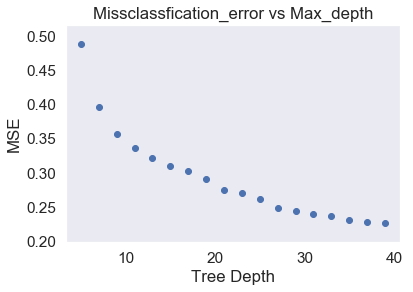

In [77]:
#Plotting thr error graph
plt.scatter(param_grid['max_depth'],MSE)
plt.xlabel('Tree Depth')
plt.ylabel('MSE')
plt.title('Missclassfication_error vs Max_depth')
plt.grid()
plt.show()

In [78]:
gsv.best_estimator_

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=39, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Accuracy on test data set: 78.727%
Precision on test data set: 0.927
Recall on test data set: 0.810
F1-Score on test data set: 0.865
Confusion Matrix of test data set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 208 ms


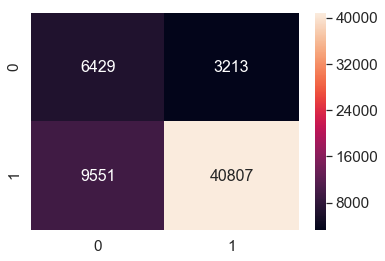

In [80]:
%%time
import seaborn as sns
alogo = gsv.best_estimator_
y_pred = alogo.predict(X_test)
print("Accuracy on test data set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test data set: %0.3f"%(precision_score(y_test, y_pred)))
print("Recall on test data set: %0.3f"%(recall_score(y_test, y_pred)))
print("F1-Score on test data set: %0.3f"%(f1_score(y_test, y_pred)))
#print("Non Zero weights:",np.count_nonzero(alogo.coef_))
print("Confusion Matrix of test data set:\n [ [TN  FP]\n [FN TP] ]\n")
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

In [46]:
list(b).count(0)

9642

In [47]:
list(b).count(1)

50358

From the above grap we can able to see that our model able to predict 66%(6429 out of 9642) negative class label prefectly and 81%(40807 out of 50358) postive class label

# Most Important Features in wordcloud

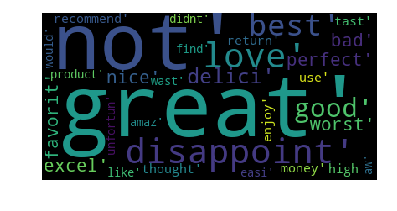

In [81]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
important_feature = alogo.feature_importances_
# Sort feature importances in descending order
indi = np.argsort(important_feature)[::-1][:30]
names = bi_gram.get_feature_names()
a=[]
for i in indi:
    a.append(names[i])
b=str(a).strip('[]')
wordcloud = WordCloud(relative_scaling = 1.0,
                     stopwords = set(STOPWORDS)
                      ).generate(b)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.186757 to fit



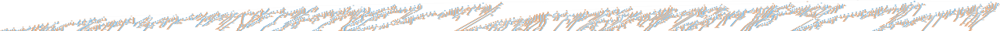

In [86]:
import graphviz 
from sklearn import tree
from IPython.display import Image
import pydotplus
dot_data = tree.export_graphviz(alogo,out_file=None,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)
colors = ('turquoise', 'orange')
Image(graph.create_jpeg())


# TF-IDF

In [87]:
%%time
from sklearn.feature_extraction.text import TfidfVectorizer

#Breaking into Train and test
X_train, X_test, y_train, y_test = train_test_split(food1_sample['CleanedText'].values,food1_sample['Score'].values,test_size=0.3,shuffle=False)

tfidf_vec = TfidfVectorizer(ngram_range=(1,2),max_features=5000) #Using bi-grams
X_train = tfidf_vec.fit_transform(X_train)
#Normalize Data
X_train = preprocessing.normalize(X_train)
print("Train Data Size: ",X_train.shape)
X_test = tfidf_vec.transform(X_test)
#Normalize Data
X_test = preprocessing.normalize(X_test)
print("Test Data Size: ",X_test.shape)

Train Data Size:  (140000, 5000)
Test Data Size:  (60000, 5000)
Wall time: 29 s


In [90]:
from sklearn.tree import DecisionTreeClassifier
alogo = DecisionTreeClassifier(class_weight='balanced',min_samples_split=5,min_samples_leaf=2)
#alogo = DecisionTreeClassifier(min_samples_split=,min_samples_leaf=25)
#params we need to try on classifier
param_grid = {'max_depth':[int(i) for i in range(5, 40, 2)]} 
gsv = GridSearchCV(alogo,param_grid,cv=timesplit,verbose=1,n_jobs=-1,scoring='f1_micro')
gsv.fit(X_train,y_train)
export(gsv,"gsv_bigram")
print("Best HyperParameter: ",gsv.best_params_)
print("Best Score: %.2f%%"%(gsv.best_score_*100))

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed:  7.4min finished


Best HyperParameter:  {'max_depth': 39}
Best Score: 78.10%


In [91]:
Cross_validation_score=gsv.cv_results_["mean_test_score"]
MSE = 1-Cross_validation_score
MSE

array([0.49522857, 0.43077143, 0.35532381, 0.3338381 , 0.31071429,
       0.30840952, 0.29310476, 0.28162857, 0.26450476, 0.24947619,
       0.24684762, 0.24242857, 0.23748571, 0.23094286, 0.22760952,
       0.22479048, 0.22187619, 0.21895238])

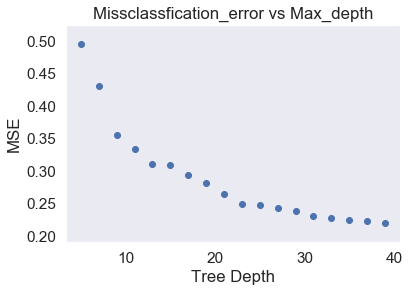

In [92]:
#Plotting thr error graph
plt.scatter(param_grid['max_depth'],MSE)
plt.xlabel('Tree Depth')
plt.ylabel('MSE')
plt.title('Missclassfication_error vs Max_depth')
plt.grid()
plt.show()

Accuracy on test data set: 78.310%
Precision on test data set: 0.929
Recall on test data set: 0.803
F1-Score on test data set: 0.862
Confusion Matrix of test data set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 192 ms


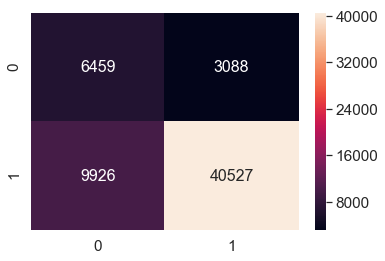

In [94]:
%%time
import seaborn as sns
alogo = gsv.best_estimator_
y_pred = alogo.predict(X_test)
print("Accuracy on test data set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test data set: %0.3f"%(precision_score(y_test, y_pred)))
print("Recall on test data set: %0.3f"%(recall_score(y_test, y_pred)))
print("F1-Score on test data set: %0.3f"%(f1_score(y_test, y_pred)))
#print("Non Zero weights:",np.count_nonzero(alogo.coef_))
print("Confusion Matrix of test data set:\n [ [TN  FP]\n [FN TP] ]\n")
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

From the above grap we can able to see that our model able to predict 67%(6459 out of 9642) negative class label prefectly and 80%(40527 out of 50358) postive class label

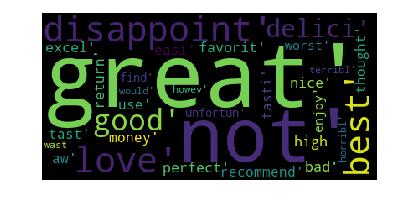

In [95]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
important_feature = alogo.feature_importances_
# Sort feature importances in descending order
indi = np.argsort(important_feature)[::-1][:30]
names = tfidf_vec.get_feature_names()
a=[]
for i in indi:
    a.append(names[i])
b=str(a).strip('[]')
wordcloud = WordCloud(relative_scaling = 1.0,
                     stopwords = set(STOPWORDS)
                      ).generate(b)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.194245 to fit



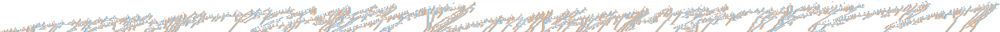

In [96]:
import graphviz 
from sklearn import tree
from IPython.display import Image
import pydotplus
dot_data = tree.export_graphviz(alogo,out_file=None,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)
colors = ('turquoise', 'orange')
Image(graph.create_jpeg())

# Clean the text with no stem for avgw2v and tfidf-w2v model

In [27]:
import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

stop = set(stopwords.words('english')) #set of stopwords
stop.remove('not')
sno = nltk.stem.SnowballStemmer('english') #initialising the snowball stemmer

def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned
print(stop)
print('************************************')
print(sno.stem('tasty'))

{'or', 'me', 'each', 'again', "wouldn't", 'and', 'there', "should've", 'can', 're', 'shan', 'too', 'these', "weren't", "haven't", 'for', 'should', 'about', 'of', 'just', 'those', 'hadn', "shouldn't", 'some', "won't", 'their', 'being', 'at', 'both', 'which', 'had', 'only', 'wasn', "you're", "you'd", 've', 'will', "isn't", 'once', 'over', 'herself', "hadn't", "mustn't", 'our', 'that', 'its', 'until', 's', 'what', "wasn't", "don't", "didn't", 'through', 'mightn', 'against', "needn't", 'yourselves', 'his', 'than', 'we', 'have', 'o', 'she', 'my', 'a', 'nor', 'then', 'are', 'him', 'doesn', 'under', 'but', 'further', 'themselves', 'after', 'it', 'll', 'if', 'from', 'such', "you've", 'before', "hasn't", 'd', 'been', 'them', 't', 'whom', 'why', 'here', 'itself', "mightn't", 'hers', 'off', 'any', 'other', 'most', 'same', 'did', 'no', 'y', 'between', 'am', 'is', 'where', "aren't", 'they', 'an', 'ain', 'your', "shan't", 'don', 'does', 'mustn', 'i', 'when', 'himself', 'who', 'so', 'all', 'very', 'y

# Spliting the train and test data before running any model

In [12]:
X_train, X_test, y_train, y_test = train_test_split(food1_sample['Text'].values,food1_sample['Score'].values,test_size=0.3,shuffle=False)

In [28]:
i=0
train_list_of_sent=[]
for sent in X_train:
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    train_list_of_sent.append(filtered_sentence)

In [29]:
print(len(train_list_of_sent))
export(train_list_of_sent,'train_list_of_sent')

140000


In [30]:
i=0
Test_list_of_sent=[]
for sent in X_test:
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    Test_list_of_sent.append(filtered_sentence)

In [104]:
print(len(Test_list_of_sent))
export(Test_list_of_sent,'Test_list_of_sent')

60000


# w2v model

Here we are using the google trained w2v model.
1. for using the w2v model , minimum 16 GB RAM required . so please carefull about it 

In [9]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

# Avg w2v model

Convert all the words to vectors and then just take the avg of the vectors the resulting vector represent the sentence

In [144]:
%%time
#np.seterr(divide='ignore', invalid='ignore')
# average Word2Vec
# compute average word2vec for each review.
train_sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(train_list_of_sent): # for each review/sentence
    sent_vec = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    train_sent_vectors.append(sent_vec)
print(len(train_sent_vectors))
print(len(train_sent_vectors[0]))
export(train_sent_vectors,'train_sent_vectors')

100%|█████████████████████████████████| 140000/140000 [02:29<00:00, 936.81it/s]


140000
300
Wall time: 2min 34s


In [145]:
train_sent_vectors = np.array(train_sent_vectors)

In [146]:
np.isnan(train_sent_vectors).any()

False

In [109]:
%%time
#np.seterr(divide='ignore', invalid='ignore')
# average Word2Vec
# compute average word2vec for each review.
Test_sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(Test_list_of_sent): # for each review/sentence
    sent_vec = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    Test_sent_vectors.append(sent_vec)
print(len(Test_sent_vectors))
print(len(Test_sent_vectors[0]))
export(Test_sent_vectors,'Test_sent_vectors')

100%|███████████████████████████████████| 60000/60000 [01:04<00:00, 924.00it/s]


60000
300
Wall time: 1min 6s


In [110]:
Test_sent_vectors = np.array(Test_sent_vectors)

In [111]:
from sklearn.preprocessing import Imputer
mean_imputer = Imputer(missing_values='NaN', strategy='median')
Test_sent_vectors = mean_imputer.fit_transform(Test_sent_vectors)

# GridSearchCV

In [147]:
from sklearn.tree import DecisionTreeClassifier
alogo = DecisionTreeClassifier(class_weight='balanced',min_samples_split=5,min_samples_leaf=2)
#alogo = DecisionTreeClassifier(min_samples_split=,min_samples_leaf=25)
#params we need to try on classifier
param_grid = {'max_depth':[int(i) for i in range(5, 40, 2)]} 
gsv = GridSearchCV(alogo,param_grid,cv=timesplit,verbose=1,n_jobs=-1,scoring='f1_micro')
gsv.fit(train_sent_vectors,y_train)
export(gsv,"gsv_bigram")
print("Best HyperParameter: ",gsv.best_params_)
print("Best Accuracy: %.2f%%"%(gsv.best_score_*100))

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed: 13.4min finished


Best HyperParameter:  {'max_depth': 39}
Best Accuracy: 79.76%


# Missclassfication_error  vs Max_depth

In [148]:
Cross_validation_score=gsv.cv_results_["mean_test_score"]
MSE = 1-Cross_validation_score
MSE

array([0.36589524, 0.33880952, 0.31942857, 0.28649524, 0.25841905,
       0.23866667, 0.22654286, 0.21892381, 0.21269524, 0.21073333,
       0.20789524, 0.20557143, 0.20533333, 0.20374286, 0.20339048,
       0.20267619, 0.20237143, 0.20235238])

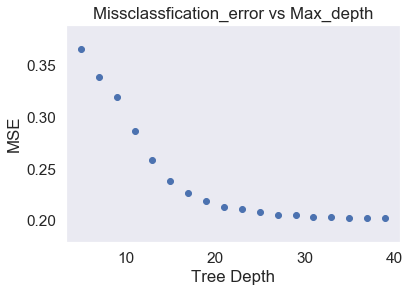

In [149]:
#Plotting thr error graph
plt.scatter(param_grid['max_depth'],MSE)
plt.xlabel('Tree Depth')
plt.ylabel('MSE')
plt.title('Missclassfication_error vs Max_depth')
plt.grid()
plt.show()

# From the above plot we are getting the Missclassfication_error less during the tree depth 39. So our best tree depth is 39.

In [152]:
gsv

GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=3),
       error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1_micro', verbose=1)

In [150]:
gsv.best_estimator_

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=39, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Accuracy on test data set: 78.818%
Precision on test data set: 0.874
Recall on test data set: 0.875
F1-Score on test data set: 0.874
Confusion Matrix of test data set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 290 ms


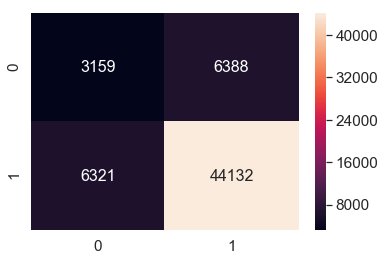

In [151]:
%%time
import seaborn as sns
alogo = gsv.best_estimator_
y_pred = alogo.predict(Test_sent_vectors)
print("Accuracy on test data set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test data set: %0.3f"%(precision_score(y_test, y_pred)))
print("Recall on test data set: %0.3f"%(recall_score(y_test, y_pred)))
print("F1-Score on test data set: %0.3f"%(f1_score(y_test, y_pred)))
#print("Non Zero weights:",np.count_nonzero(alogo.coef_))
print("Confusion Matrix of test data set:\n [ [TN  FP]\n [FN TP] ]\n")
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

From the above grap we can able to see that our model able to predict 33.8%(3159 out of 9547) negative class label prefectly and 87.47%(44132 out of 50453) postive class label

# Visulaizing the Tree

https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0823151 to fit



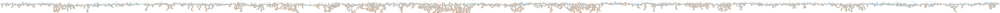

In [132]:
import graphviz 
from sklearn import tree
from IPython.display import Image
import pydotplus
dot_data = tree.export_graphviz(alogo,out_file=None,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)
colors = ('turquoise', 'orange')
Image(graph.create_jpeg())

# TFIDF-W2V

In [10]:
train_list_of_sent=import1('train_list_of_sent')
Test_list_of_sent=import1('Test_list_of_sent')

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing
tfidf = TfidfVectorizer(ngram_range=(1,1),max_features=5000) #Using bi-grams
tfidf_vec = tfidf.fit_transform(X_train)

In [14]:
dictionary = dict(zip(tfidf.get_feature_names(), list(tfidf.idf_)))

In [31]:
%%time
# TF-IDF weighted Word2Vec
# tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
train_tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(train_list_of_sent): # for each review/sentence
    sent_vec = np.zeros(300) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = model.wv[word]
            #print(vec)
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = dictionary[word]*sent.count(word)
            #print()
            sent_vec += (vec * tf_idf)
            #print(sent_vec)
            #print(tfidf)
            #print(sent_vec)
            weight_sum += tf_idf
        except:
            pass
    sent_vec /= weight_sum
    train_tfidf_sent_vectors.append(sent_vec)
    row += 1
    

100%|█████████████████████████████████| 140000/140000 [03:52<00:00, 602.66it/s]


Wall time: 3min 52s


In [32]:
train_tfidf_sent_vectors = np.array(train_tfidf_sent_vectors)

In [34]:
from sklearn.preprocessing import Imputer
mean_imputer = Imputer(missing_values='NaN', strategy='median')
train_sent_vectors = mean_imputer.fit_transform(train_tfidf_sent_vectors)

In [138]:
export(train_tfidf_sent_vectors,'train_tfidf_sent_vectors')

In [36]:
np.isnan(train_sent_vectors).any()

False

In [37]:
%%time
# TF-IDF weighted Word2Vec
# tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
test_tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(Test_list_of_sent): # for each review/sentence
    sent_vec = np.zeros(300) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = model.wv[word]
            #print(vec)
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = dictionary[word]*sent.count(word)
            #print()
            sent_vec += (vec * tf_idf)
            #print(sent_vec)
            #print(tfidf)
            #print(sent_vec)
            weight_sum += tf_idf
        except:
            pass
    sent_vec /= weight_sum
    test_tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|███████████████████████████████████| 60000/60000 [01:41<00:00, 589.27it/s]


Wall time: 1min 41s


In [38]:
test_tfidf_sent_vectors = np.array(test_tfidf_sent_vectors)

In [39]:
from sklearn.preprocessing import Imputer
mean_imputer = Imputer(missing_values='NaN', strategy='median')
test_tfidf_sent_vectors = mean_imputer.fit_transform(test_tfidf_sent_vectors)

In [29]:
export(test_tfidf_sent_vectors,'test_tfidf_sent_vectors')

# GridSearchCV

In [40]:
from sklearn.tree import DecisionTreeClassifier
#alogo = DecisionTreeClassifier(class_weight="balanced")
#params we need to try on classifier
#param_grid = {'max_depth':[int(i) for i in range(5, 40, 2)]}
#gsv = GridSearchCV(alogo,param_grid,cv=timesplit,verbose=1,n_jobs=-1)
alogo = DecisionTreeClassifier(class_weight='balanced',min_samples_split=5,min_samples_leaf=2)
#alogo = DecisionTreeClassifier(min_samples_split=,min_samples_leaf=25)
#params we need to try on classifier
param_grid = {'max_depth':[int(i) for i in range(5, 40, 2)]} 
gsv = GridSearchCV(alogo,param_grid,cv=timesplit,verbose=1,n_jobs=-1,scoring='f1_micro')
gsv.fit(train_sent_vectors,y_train)
export(gsv,"gsv_bigram")
print("Best HyperParameter: ",gsv.best_params_)
print("Best Accuracy: %.2f%%"%(gsv.best_score_*100))

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed: 13.7min finished


Best HyperParameter:  {'max_depth': 39}
Best Accuracy: 78.62%


# Missclassfication_error vs Max_depth

In [41]:
Cross_validation_score=gsv.cv_results_["mean_test_score"]
MSE = 1-Cross_validation_score
MSE

array([0.36935238, 0.3690381 , 0.34854286, 0.3187619 , 0.28448571,
       0.25781905, 0.24099048, 0.23238095, 0.22689524, 0.22233333,
       0.21978095, 0.21828571, 0.21564762, 0.21633333, 0.21453333,
       0.2142381 , 0.21434286, 0.21382857])

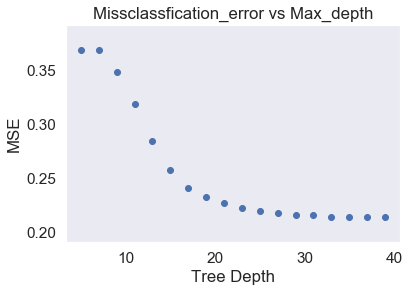

In [42]:
#Plotting thr error graph
plt.scatter(param_grid['max_depth'],MSE)
plt.xlabel('Tree Depth')
plt.ylabel('MSE')
plt.title('Missclassfication_error vs Max_depth')
plt.grid()
plt.show()

In [43]:
gsv.best_estimator_

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=39, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [51]:
gsv

GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=3),
       error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=5,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1_micro', verbose=1)

Accuracy on test data set: 77.372%
Precision on test data set: 0.866
Recall on test data set: 0.865
F1-Score on test data set: 0.865
Confusion Matrix of test data set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 283 ms


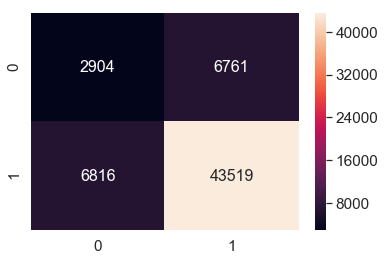

In [44]:
%%time
import seaborn as sns
alogo = gsv.best_estimator_
y_pred = alogo.predict(test_tfidf_sent_vectors)
print("Accuracy on test data set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test data set: %0.3f"%(precision_score(y_test, y_pred)))
print("Recall on test data set: %0.3f"%(recall_score(y_test, y_pred)))
print("F1-Score on test data set: %0.3f"%(f1_score(y_test, y_pred)))
#print("Non Zero weights:",np.count_nonzero(alogo.coef_))
print("Confusion Matrix of test data set:\n [ [TN  FP]\n [FN TP] ]\n")
df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

From the above grap we can able to see that our model able to predict 30.8%(2904 out of 9665) negative class label prefectly and 86.47%(43519 out of 50335) postive class label

# Visulaizing the Tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0755946 to fit



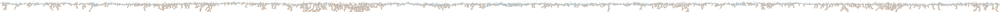

In [45]:
import graphviz 
from sklearn import tree
from IPython.display import Image
import pydotplus
dot_data = tree.export_graphviz(alogo,out_file=None,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)
colors = ('turquoise', 'orange')
Image(graph.create_jpeg())

# Performance Table

In [52]:
from prettytable import PrettyTable
x = PrettyTable()

x.field_names = ["Model","hyper parameter/Depth", "Train Accuracy","Test Accuracy","F1-Score"]

x.add_row(["BOW", 39, "77.38%","78.727%" ,0.865])
x.add_row(["TFIDF", 39, "78.10%" , "78.310%",0.862])
x.add_row(["Avgw2v", 39, "79.76%" , "78.818%",0.874])
x.add_row(["Tfidf-w2v",39, "78.62%%" , "77.372%",0.865])



print(x)

+-----------+-----------------------+----------------+---------------+----------+
|   Model   | hyper parameter/Depth | Train Accuracy | Test Accuracy | F1-Score |
+-----------+-----------------------+----------------+---------------+----------+
|    BOW    |           39          |     77.38%     |    78.727%    |  0.865   |
|   TFIDF   |           39          |     78.10%     |    78.310%    |  0.862   |
|   Avgw2v  |           39          |     79.76%     |    78.818%    |  0.874   |
| Tfidf-w2v |           39          |    78.62%%     |    77.372%    |  0.865   |
+-----------+-----------------------+----------------+---------------+----------+


# Conclusion

1. Decision tree for BOW and tfidf will take long time if you go for all the feaures , if we took max_feature it imporving the 
   time comaplexicty .
2. We are getting mixup result for all the 4 vectorrization , Model is not as good as linear model or logistics model for predicition . As we saw for BOW and TF-IDF it is predicitng above 60%,80% class lable as negative and positive respectivly .

3. But for avgw2v and tfidfw2v model is prediciting above 30%,80% class lable negative and positive respectivly.

4. Class_weight is playing a vital role in decisiontreeclassifer , or else classifer is biased towards higer value of class levels , i tired to train the classifier without class_weight it predicitng almost every time postive class .

5. Scoring in gridseacrhcv also playing vital role , as here we use "f1_micro" . we see it is finding the best hyperparameters propely.

6. Considering f1 score we are getting classifer performing good in avgw2v vectorizer.